In [21]:
import csv
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
from matplotlib.pyplot import specgram

### Load Data

In [4]:
SAMPLE_RATE = 22050
T = 4.0
NUM_SAMPLES = int(SAMPLE_RATE * T)

N_train = 10
N_class = 10

class_labels = ['air_conditioner', 'car_horn', 'children_playing', 'dog_bark', 'drilling', 'engine_idling', 'gun_shot', 'jackhammer', 'siren', 'street_music']

In [12]:
X_train = np.empty((0, NUM_SAMPLES))
y_train = np.empty((0, 1), dtype=int)
used_labels = set()

with open('train.csv', 'rb') as f:
    reader = csv.reader(f)
    for row in reader:
        if not row[-1] in used_labels:
            used_labels.add(row[-1])
            new_x = np.array(row[:-1])
            new_x = new_x.astype(np.float)
            new_y = np.array(float(row[-1]))
            new_y = new_y.astype(int)
            X_train = np.vstack((X_train, new_x))
            y_train = np.append(y_train, new_y)
            if len(used_labels) >= N_class:
                break

In [15]:
order = y_train.argsort()
X_train = X_train[order[::1]]
y_train = y_train[order[::1]]

[ 0.         -0.04933633  0.03625989  0.01876619  0.02029207 -0.04662734
  0.07013489 -0.02004916  0.01519834  0.00437637]
[0 1 2 3 4 5 6 7 8 9]


### Mel Spec

In [16]:
BINS_OCTAVE = 12 * 2
N_OCTAVES = 7
NUM_BINS = BINS_OCTAVE * N_OCTAVES

FEATS = 168
FRAMES = 173

In [17]:
def mel_spec(y):
    Q = librosa.cqt(y=y, sr=SAMPLE_RATE, bins_per_octave=BINS_OCTAVE, n_bins=NUM_BINS)
    Q_db = librosa.amplitude_to_db(Q, ref=np.max)
    return Q_db

In [23]:
def plot_mel(raw_sounds):
    fig = plt.figure(figsize=(30, 30), dpi=300)
    for i in range(len(raw_sounds)):
        plt.subplot(10, 1, i + 1)
        librosa.display.specshow(mel_spec(X_train[i]), y_axis='hz')
        plt.title(class_labels[y_train[i]])

    plt.suptitle("Figure 1: Waveplot", x=0.5, y=0.915, fontsize=18)
    plt.show()

In [24]:
plot_mel(X_train)

### Waves

In [25]:
def plot_waves(raw_sounds):
    fig = plt.figure(figsize=(30, 30), dpi=300)
    for i in range(len(raw_sounds)):
        plt.subplot(10, 1, i + 1)
        librosa.display.waveplot(np.array(raw_sounds[i]),sr=SAMPLE_RATE)
        plt.title(class_labels[y_train[i]])
        
    plt.suptitle("Figure 2: Spectrogram", x=0.5, y=0.915, fontsize=18)
    plt.show()

In [26]:
plot_waves(X_train)

### Specgram

In [28]:
def plot_specgram(raw_sounds):
    fig = plt.figure(figsize=(30, 30), dpi=150)
    for i in range(len(raw_sounds)):
        plt.subplot(10, 1, i + 1)
        specgram(np.array(raw_sounds[i]), Fs=SAMPLE_RATE)
        plt.title(class_labels[y_train[i]])
        
    plt.suptitle("Figure 2: Spectrogram", x=0.5, y=0.915, fontsize=18)
    plt.show()

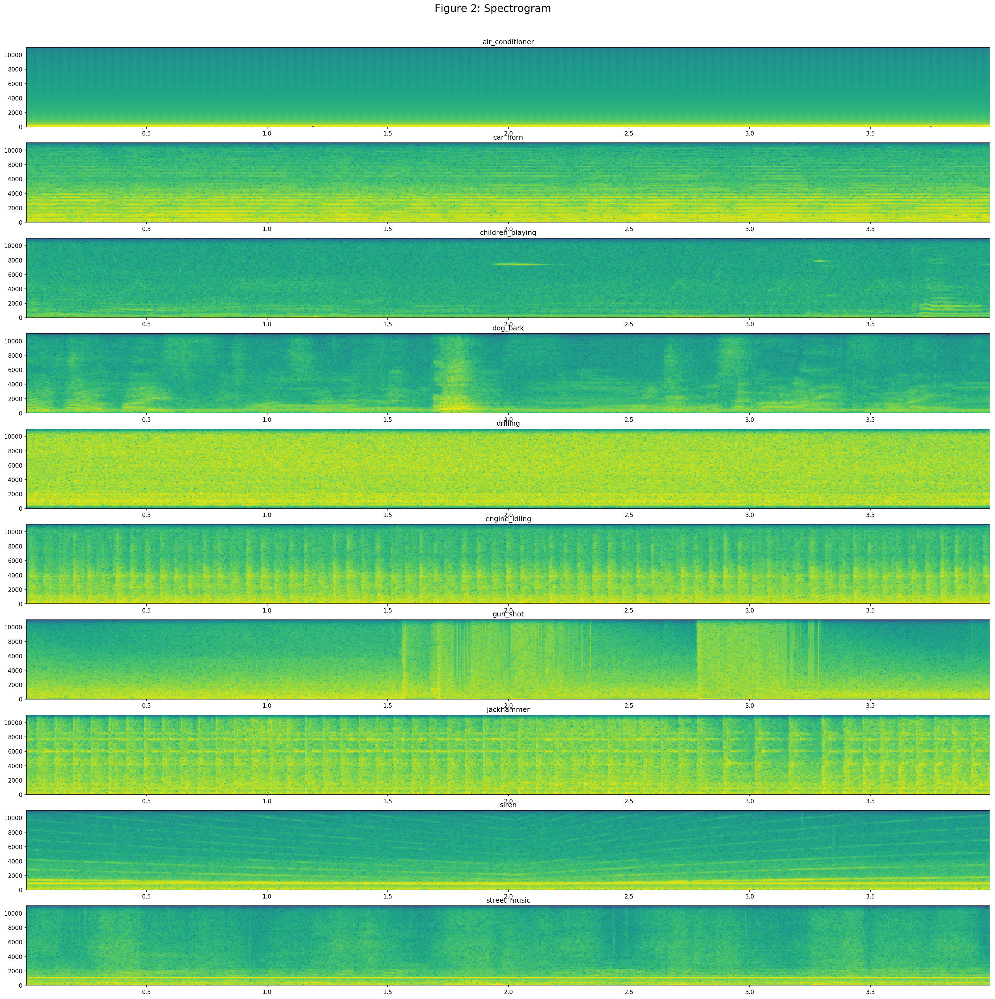

In [29]:
plot_specgram(X_train)